In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [75]:
#read in dataset
df = pd.read_csv('train.csv')

In [76]:
pd.set_option('display.max_columns', 999)
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [69]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


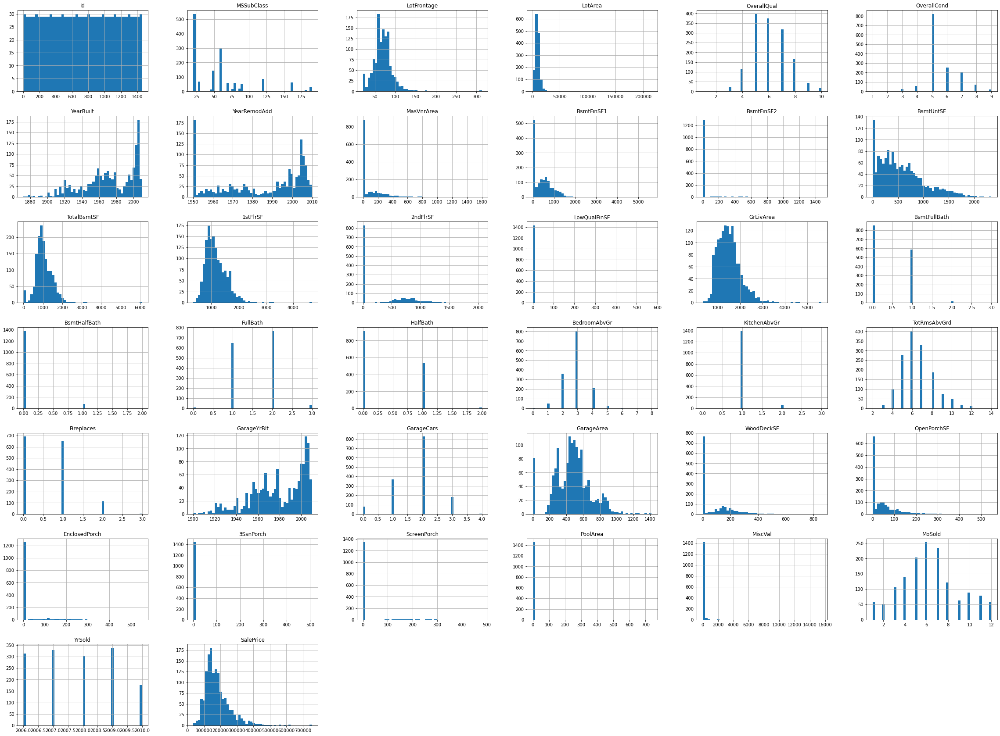

In [8]:
df.hist(bins=50, figsize=(40,30))
plt.show()

In [9]:
corr_matrix = df.corr()

In [10]:
corr_matrix

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.010601,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.050298,-0.005024,...,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.386347,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.010601,-0.386347,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,...,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,-0.033226,-0.139781,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.050298,0.022936,0.193458,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,...,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,-0.005024,-0.069836,0.233633,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420


In [11]:
from pandas.plotting import scatter_matrix
scatter_matrix(df, figsize=(200, 100))

array([[<AxesSubplot:xlabel='Id', ylabel='Id'>,
        <AxesSubplot:xlabel='MSSubClass', ylabel='Id'>,
        <AxesSubplot:xlabel='LotFrontage', ylabel='Id'>, ...,
        <AxesSubplot:xlabel='MoSold', ylabel='Id'>,
        <AxesSubplot:xlabel='YrSold', ylabel='Id'>,
        <AxesSubplot:xlabel='SalePrice', ylabel='Id'>],
       [<AxesSubplot:xlabel='Id', ylabel='MSSubClass'>,
        <AxesSubplot:xlabel='MSSubClass', ylabel='MSSubClass'>,
        <AxesSubplot:xlabel='LotFrontage', ylabel='MSSubClass'>, ...,
        <AxesSubplot:xlabel='MoSold', ylabel='MSSubClass'>,
        <AxesSubplot:xlabel='YrSold', ylabel='MSSubClass'>,
        <AxesSubplot:xlabel='SalePrice', ylabel='MSSubClass'>],
       [<AxesSubplot:xlabel='Id', ylabel='LotFrontage'>,
        <AxesSubplot:xlabel='MSSubClass', ylabel='LotFrontage'>,
        <AxesSubplot:xlabel='LotFrontage', ylabel='LotFrontage'>, ...,
        <AxesSubplot:xlabel='MoSold', ylabel='LotFrontage'>,
        <AxesSubplot:xlabel='YrSold', ylabel='

### Investigate columns with na

In [70]:
cols = list(df.columns)

In [71]:
for col in cols:
    if df[col].isna().sum() == 0:
        continue
    else:
        print(col, df[col].isna().sum())

LotFrontage 259
Alley 1369
MasVnrType 8
MasVnrArea 8
BsmtQual 37
BsmtCond 37
BsmtExposure 38
BsmtFinType1 37
BsmtFinType2 38
Electrical 1
FireplaceQu 690
GarageType 81
GarageYrBlt 81
GarageFinish 81
GarageQual 81
GarageCond 81
PoolQC 1453
Fence 1179
MiscFeature 1406


In [72]:
df['Alley'].value_counts()

Grvl    50
Pave    41
Name: Alley, dtype: int64

In [73]:
# fill all Nan with No alley according to data description text
df['Alley'].fillna('No Alley', inplace = True)

In [74]:
df['Alley'].value_counts()

No Alley    1369
Grvl          50
Pave          41
Name: Alley, dtype: int64

In [75]:
df['MasVnrType'].value_counts()

None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [76]:
df[df['MasVnrType'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
234,235,60,RL,NaN,7851,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,216500
529,530,20,RL,NaN,32668,Pave,No Alley,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Alloca,200624
650,651,60,FV,65.0,8125,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,813,813,GasA,Ex,Y,SBrkr,822,843,0,1665,0,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,2007.0,RFn,2,562,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,205950
936,937,20,RL,67.0,10083,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Normal,184900
973,974,20,FV,95.0,11639,Pave,No Alley,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1428,1428,GasA,Ex,Y,SBrkr,1428,0,0,1428,0,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2007.0,Fin,2,480,TA,TA,Y,0,120,0,0,0,0,NaN,NaN,NaN,0,12,2008,New,Partial,182000
977,978,120,FV,35.0,4274,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,TwnhsE,1Story,7,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,1106,Unf,0,135,1241,GasA,Ex,Y,SBrkr,1241,0,0,1241,1,0,1,1,1,1,Gd,4,Typ,0,NaN,Attchd,2007.0,Fin,2,569,TA,TA,Y,0,116,0,0,0,0,NaN,NaN,NaN,0,11,2007,New,Partial,199900
1243,1244,20,RL,107.0,13891,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Ex,TA,PConc,Ex,Gd,Gd,GLQ,1386,Unf,0,690,2076,GasA,Ex,Y,SBrkr,2076,0,0,2076,1,0,2,1,2,1,Ex,7,Typ,1,Gd,Attchd,2006.0,Fin,3,850,TA,TA,Y,216,229,0,0,0,0,NaN,NaN,NaN,0,9,2006,New,Partial,465000
1278,1279,60,RL,75.0,9473,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,804,Unf,0,324,1128,GasA,Ex,Y,SBrkr,1128,903,0,2031,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,RFn,2,577,TA,TA,Y,0,211,0,0,0,0,NaN,NaN,NaN,0,3,2008,WD,Normal,237000


In [77]:
# fill all Nan with None, seems like most likely case
df['MasVnrType'].fillna('None', inplace = True)

In [78]:
df['MasVnrType'].value_counts()

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

<AxesSubplot:xlabel='MasVnrArea', ylabel='SalePrice'>

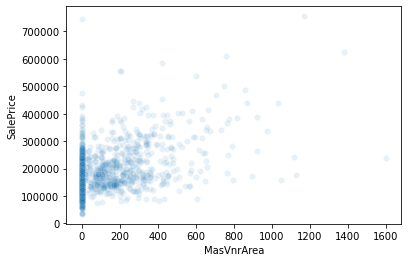

In [79]:
sns.scatterplot(x='MasVnrArea', y='SalePrice', data= df, alpha=0.1)

In [80]:
#this column shares the same Nan values as the previous, will fill these values with 0 based off making the previous values none
df['MasVnrArea'].fillna(0.0, inplace = True)

In [81]:
df['MasVnrArea'].value_counts()

0.0      869
72.0       8
180.0      8
108.0      8
120.0      7
        ... 
651.0      1
337.0      1
415.0      1
293.0      1
621.0      1
Name: MasVnrArea, Length: 327, dtype: int64

In [82]:
df['BsmtQual'].value_counts()

TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

<AxesSubplot:xlabel='BsmtQual', ylabel='count'>

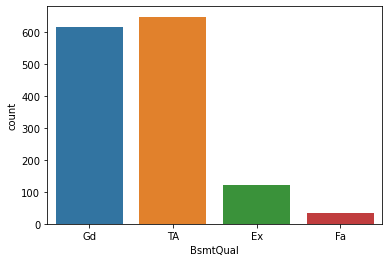

In [83]:
sns.countplot(x='BsmtQual', data = df)

In [84]:
#according to data text doc all Nan values mean no basement
df['BsmtQual'].fillna('None', inplace = True)

In [85]:
#according to data text doc all Nan values mean no basement
df['BsmtCond'].fillna('None', inplace = True)

In [86]:
#according to data text doc all Nan values mean no basement
df['BsmtExposure'].fillna('None', inplace = True)

In [87]:
#according to data text doc all Nan values mean no basement
df['BsmtFinType1'].fillna('None', inplace = True)

In [88]:
#according to data text doc all Nan values mean no basement
df['BsmtFinType2'].fillna('None', inplace = True)

In [89]:
df[df['Electrical'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1379,1380,80,RL,73.0,9735,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500


In [90]:
df[df['CentralAir']=='Y']['Electrical'].value_counts()

SBrkr    1282
FuseA      72
FuseF       9
Mix         1
Name: Electrical, dtype: int64

In [91]:
ca = df[df['CentralAir']=='Y']

In [92]:
ca[ca['YearBuilt']>2000]['Electrical'].value_counts()

SBrkr    363
Name: Electrical, dtype: int64

In [93]:
#after investigating all houses built after 2000 have SBrkr as electrical type
df['Electrical'].fillna('SBrkr', inplace = True)

In [94]:
df['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [95]:
df[df['FireplaceQu'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
5,6,50,RL,85.0,14115,Pave,No Alley,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
10,11,20,RL,70.0,11200,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Hip,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,906,Unf,0,134,1040,GasA,Ex,Y,SBrkr,1040,0,0,1040,1,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1965.0,Unf,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,129500
12,13,20,RL,NaN,12968,Pave,No Alley,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,NaN,NaN,NaN,0,9,2008,WD,Normal,144000
15,16,45,RM,51.0,6120,Pave,No Alley,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Norm,Norm,1Fam,1.5Unf,7,8,1929,2001,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,832,832,GasA,Ex,Y,FuseA,854,0,0,854,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1991.0,Unf,2,576,TA,TA,Y,48,112,0,0,0,0,NaN,GdPrv,NaN,0,7,2007,WD,Normal,132000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,1453,180,RM,35.0,3675,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,145000
1453,1454,20,RL,90.0,17217,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1140,1140,GasA,Ex,Y,SBrkr,1140,0,0,1140,0,0,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,36,56,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Abnorml,84500
1454,1455,20,FV,62.0,7500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,410,Unf,0,811,1221,GasA,Ex,Y,SBrkr,1221,0,0,1221,1,0,2,0,2,1,Gd,6,Typ,0,NaN,Attchd,2004.0,RFn,2,400,TA,TA,Y,0,113,0,0,0,0,NaN,NaN,NaN,0,10,2009,WD,Normal,185000
1458,1459,20,RL,68.0,9717,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,

In [96]:
#according to data text doc all Nan values mean no fireplace
df['FireplaceQu'].fillna('None', inplace = True)

In [97]:
df['GarageType'].value_counts()

Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [98]:
#according to data text doc all Nan values mean no garage
df['GarageType'].fillna('None', inplace = True)

In [99]:
df['GarageYrBlt'].value_counts()

2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
          ..
1908.0     1
1927.0     1
1933.0     1
1900.0     1
1906.0     1
Name: GarageYrBlt, Length: 97, dtype: int64

<AxesSubplot:xlabel='GarageYrBlt', ylabel='SalePrice'>

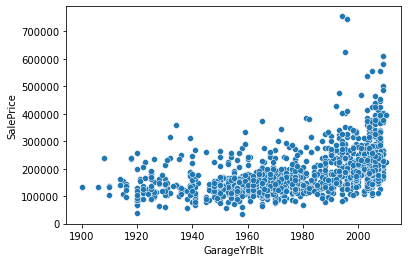

In [100]:
sns.scatterplot(x='GarageYrBlt', y='SalePrice', data =df)

In [101]:
df[['GarageYrBlt', 'YearBuilt']]

,GarageYrBlt,YearBuilt
0,2003.0,2003
1,1976.0,1976
2,2001.0,2001
3,1998.0,1915
4,2000.0,2000
...,...,...
1455,1999.0,1999
1456,1978.0,1978
1457,1941.0,1941
1458,1950.0,1950


In [102]:
#according to data text doc all Nan values mean no garage
df['GarageFinish'].fillna('None', inplace = True)

In [103]:
#according to data text doc all Nan values mean no garage
df['GarageQual'].fillna('None', inplace = True)

In [104]:
#according to data text doc all Nan values mean no garage
df['GarageCond'].fillna('None', inplace = True)

In [105]:
df['PoolQC'].value_counts()

Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64

In [106]:
#according to data text doc all Nan values mean no pool
df['PoolQC'].fillna('None', inplace = True)

In [107]:
df['Fence'].value_counts()

MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64

In [108]:
#according to data text doc all Nan values mean no fence
df['Fence'].fillna('None', inplace = True)

In [109]:
df['MiscFeature'].value_counts()

Shed    49
Othr     2
Gar2     2
TenC     1
Name: MiscFeature, dtype: int64

In [110]:
#according to data text doc all Nan values mean no other features
df['MiscFeature'].fillna('None', inplace = True)

In [117]:
for col in cols:
    if df[col].isna().sum() == 0:
        continue
    else:
        print(col, df[col].isna().sum())

LotFrontage 259
GarageYrBlt 81


LotFrontage and GarageYrBlt are not easy to impute values for as they are kind of continuous and dsicrete features. Garage Year Built for instance gives years the garage was built but is Nan when there is no garage. As a first step I will try to just make this a binary variable for our models, either there is a garage or no garage and work from there. I will also not add in LotFrontage for the time being to our model and perhaps look at adding it in later

In [118]:
df['Garage'] = np.where(df['GarageYrBlt'].isna(), 0, 1)

In [119]:
df['Garage'].value_counts()

1    1379
0      81
Name: Garage, dtype: int64

save df so we can import later with altered df

In [120]:
df.to_csv('housing_cleaned.csv', index = False)

In [134]:
df_clean = pd.read_csv('housing_cleaned.csv', index_col = 'Id')

In [135]:
df_clean.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Garage
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,208500,1
2,20,RL,80.0,9600,Pave,No Alley,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,181500,1
3,60,RL,68.0,11250,Pave,No Alley,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,223500,1
4,70,RL,60.0,9550,Pave,No Alley,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,140000,1
5,60,RL,84.0,14260,Pave,No Alley,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,250000,1


In [136]:
# create a list of columns of dataframe
feature_list = list(df_clean.columns)

In [137]:
# remove features from feature list that we intialized in feature_string
feature_list.remove('SalePrice')
feature_list.remove('GarageYrBlt')
feature_list.remove('1stFlrSF')
feature_list.remove('2ndFlrSF')
feature_list.remove('3SsnPorch')

In [138]:
#join feature list to make feature_string for use with ols
feature_string = ' + '.join(feature_list)

In [139]:
feature_string = 'SalePrice ~ ' + feature_string

In [140]:
# take a first look at a model
df_test = ols(formula=feature_string, data=df_clean).fit()
df_test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     61.16
Date:                Fri, 23 Apr 2021   Prob (F-statistic):               0.00
Time:                        11:30:07   Log-Likelihood:                -13640.
No. Observations:                1201   AIC:                         2.776e+04
Df Residuals:                     961   BIC:                         2.898e+04
Df Model:                         239                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                -1.469e+06   5.62e+05     -2.615      0.009   -2.57e+06   -3.67e+05
MSZoning[T.FV]            3.866e+04   1.28e+04      3.032      0.002    1.36e+04    6.37e+04
MSZoning[T.RH]            2.764e+04   1.29e+04      2.136      0.033    2250.792     5.3e+04
MSZoning[T.RL]            2.706e+04   1.09e+04      2.471      0.014    5572.353    4.85e+04
MSZoning[T.RM]            2.349e+04   1.02e+04      2.300      0.022    3446.686    4.35e+04
Street[T.Pave]            2.991e+04   1.43e+04      2.092      0.037    1857.516     5.8e+04
Alley[T.No Alley]          318.0642   4557.491      0.070      0.944   -8625.719    9261.847
Alley[T.Pave]            -4144.0018   6629.108     -0.625      0.532   -1.72e+04    8865.195
LotShape[T.IR2]           4964.0957   5583.516      0.889      0.374   -5993.195    1.59e+04
LotShape[T.IR3]           1.273e+04    1.2e+04      1.063      0.288   -1.08e+04    3.62e+04
LotShape[T.Reg]           3091.4732   1956.711      1.580      0.114    -748.446    6931.392
LandContour[T.HLS]        9587.6814   5781.645      1.658      0.098   -1758.424    2.09e+04
LandContour[T.Low]       -1.576e+04   8389.111     -1.878      0.061   -3.22e+04     706.533
LandContour[T.Lvl]        7243.2521   4227.972      1.713      0.087   -1053.870    1.55e+04
Utilities[T.NoSeWa]       -5.18e-06   1.99e-06     -2.605      0.009   -9.08e-06   -1.28e-06
LotConfig[T.CulDSac]      1.399e+04   4879.493      2.868      0.004    4418.993    2.36e+04
LotConfig[T.FR2]         -8253.0105   4981.262     -1.657      0.098    -1.8e+04    1522.395
LotConfig[T.FR3]         -1.579e+04   1.31e+04     -1.209      0.227   -4.14e+04    9829.240
LotConfig[T.Inside]      -1032.6304   2134.687     -0.484      0.629   -5221.815    3156.554
LandSlope[T.Mod]          7407.7780   4658.036      1.590      0.112   -1733.317    1.65e+04
LandSlope[T.Sev]         -4.062e+04   1.53e+04     -2.650      0.008   -7.07e+04   -1.05e+04
Neighborhood[T.Blueste]   1.169e+04   2.04e+04      0.572      0.567   -2.84e+04    5.18e+04
Neighborhood[T.BrDale]    3184.1417   1.21e+04      0.262      0.793   -2.06e+04     2.7e+04
Neighborhood[T.BrkSide]  -2766.6198   1.07e+04     -0.258      0.797   -2.38e+04    1.83e+04
Neighborhood[T.ClearCr]  -1.221e+04   1.13e+04     -1.084      0.279   -3.43e+04    9891.564
Neighborhood[T.CollgCr]  -6963.9296   8279.665     -0.841      0.401   -2.32e+04    9284.380
Neighborhood[T.Crawfor]   1.495e+04   9731.229      1.536      0.125   -4147.006     3.4e+04
Neighborhood[T.Edwards]  -1.802e+04   9006.132     -2.001      0.046   -3.57e+04    -343.177
Neighborhood[T.Gilbert]  -9490.8253   8893.648     -1.067      0.286   -2.69e+04    7962.387
Neighborhood[T.IDOTRR]   -4568.5568   1.21e+04     -0.378      0.705   -2.83e+04    1.91e+04
Neighborhood[T

In [141]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, Ridge, LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.multicomp import MultiComparison

In [142]:
features = df_clean[feature_list]

In [143]:
target = df_clean['SalePrice']

now that we have features we want to use we have to encode categorical columns, we will one hot encode some columns and keep a graded scale for columns that deal with conditions

In [144]:
one_hot = ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
           'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
           'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'Electrical',
           'Functional', 'GarageType', 'PavedDrive', 'MiscFeature', 'SaleType', 'SaleCondition']

In [145]:
graded = ['LandSlope', 'OverallQual', 'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 
          'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu',
          'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence']

In [146]:
dummies = df_clean[one_hot]

In [147]:
no_dummies = df_clean.drop(one_hot, axis = 1)

In [197]:
no_dummies_cols = list(no_dummies.columns)

In [198]:
no_dummies_cols.remove('LotFrontage')
no_dummies_cols.remove('GarageYrBlt')
no_dummies_cols.remove('SalePrice')

In [148]:
# create dummy variables for one_hot columns
dummies = pd.get_dummies(dummies, columns = one_hot,drop_first=True)

In [149]:
dummies_cols = list(dummies.columns)

In [150]:
features = pd.concat([dummies,no_dummies], axis = 1)

In [151]:
features

,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No Alley,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,PavedDrive_P,PavedDrive_Y,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,LotFrontage,LotArea,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,MoSold,YrSold,SalePrice,Garage
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,

In [152]:
# set conditions/chioces for np.select command
conditions = [
    features['LandSlope']=='Sev',
    features['LandSlope']=='Mod',
    features['LandSlope']=='Gtl'
]

choices = [
    1,
    2,
    3
]

# creates a new column based on the above specified conditions and choices
features['LandSlope'] = np.select(conditions, choices, features['LandSlope'])

In [153]:
# set conditions/chioces for np.select command
conditions = [
    features['ExterQual']=='Po',
    features['ExterQual']=='Fa',
    features['ExterQual']=='TA',
    features['ExterQual']=='Gd',
    features['ExterQual']=='Ex'
    
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['ExterQual'] = np.select(conditions, choices, features['ExterQual'])

In [154]:
# set conditions/chioces for np.select command
conditions = [
    features['ExterCond']=='Po',
    features['ExterCond']=='Fa',
    features['ExterCond']=='TA',
    features['ExterCond']=='Gd',
    features['ExterCond']=='Ex'
    
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['ExterCond'] = np.select(conditions, choices, features['ExterCond'])

In [155]:
# set conditions/chioces for np.select command
conditions = [
    features['BsmtQual']=='None',
    features['BsmtQual']=='Po',
    features['BsmtQual']=='Fa',
    features['BsmtQual']=='TA',
    features['BsmtQual']=='Gd',
    features['BsmtQual']=='Ex'
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6
]

# creates a new column based on the above specified conditions and choices
features['BsmtQual'] = np.select(conditions, choices, features['BsmtQual'])

In [156]:
# set conditions/chioces for np.select command
conditions = [
    features['BsmtCond']=='None',
    features['BsmtCond']=='Po',
    features['BsmtCond']=='Fa',
    features['BsmtCond']=='TA',
    features['BsmtCond']=='Gd',
    features['BsmtCond']=='Ex'
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6
]

# creates a new column based on the above specified conditions and choices
features['BsmtCond'] = np.select(conditions, choices, features['BsmtCond'])

In [157]:
# set conditions/chioces for np.select command
conditions = [
    features['BsmtExposure']=='None',
    features['BsmtExposure']=='No',
    features['BsmtExposure']=='Mn',
    features['BsmtExposure']=='Av',
    features['BsmtExposure']=='Gd'
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['BsmtExposure'] = np.select(conditions, choices, features['BsmtExposure'])

In [158]:
# set conditions/chioces for np.select command
conditions = [
    features['BsmtFinType1']=='None',
    features['BsmtFinType1']=='Unf',
    features['BsmtFinType1']=='LwQ',
    features['BsmtFinType1']=='Rec',
    features['BsmtFinType1']=='BLQ',
    features['BsmtFinType1']=='ALQ',
    features['BsmtFinType1']=='GLQ'
    
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6,
    7
]

# creates a new column based on the above specified conditions and choices
features['BsmtFinType1'] = np.select(conditions, choices, features['BsmtFinType1'])

In [159]:
# set conditions/chioces for np.select command
conditions = [
    features['BsmtFinType2']=='None',
    features['BsmtFinType2']=='Unf',
    features['BsmtFinType2']=='LwQ',
    features['BsmtFinType2']=='Rec',
    features['BsmtFinType2']=='BLQ',
    features['BsmtFinType2']=='ALQ',
    features['BsmtFinType2']=='GLQ'
    
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6,
    7
]

# creates a new column based on the above specified conditions and choices
features['BsmtFinType2'] = np.select(conditions, choices, features['BsmtFinType2'])

In [160]:
# set conditions/chioces for np.select command
conditions = [
    features['HeatingQC']=='Po',
    features['HeatingQC']=='Fa',
    features['HeatingQC']=='TA',
    features['HeatingQC']=='Gd',
    features['HeatingQC']=='Ex'
    
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['HeatingQC'] = np.select(conditions, choices, features['HeatingQC'])

In [161]:
# set conditions/chioces for np.select command
conditions = [
    features['KitchenQual']=='Po',
    features['KitchenQual']=='Fa',
    features['KitchenQual']=='TA',
    features['KitchenQual']=='Gd',
    features['KitchenQual']=='Ex'
    
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['KitchenQual'] = np.select(conditions, choices, features['KitchenQual'])

In [162]:
# set conditions/chioces for np.select command
conditions = [
    features['FireplaceQu']=='None',
    features['FireplaceQu']=='Po',
    features['FireplaceQu']=='Fa',
    features['FireplaceQu']=='TA',
    features['FireplaceQu']=='Gd',
    features['FireplaceQu']=='Ex'
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6
]

# creates a new column based on the above specified conditions and choices
features['FireplaceQu'] = np.select(conditions, choices, features['FireplaceQu'])

In [163]:
# set conditions/chioces for np.select command
conditions = [
    features['GarageFinish']=='None',
    features['GarageFinish']=='Unf',
    features['GarageFinish']=='RFn',
    features['GarageFinish']=='Fin'
]

choices = [
    1,
    2,
    3,
    4
]

# creates a new column based on the above specified conditions and choices
features['GarageFinish'] = np.select(conditions, choices, features['GarageFinish'])

In [164]:
# set conditions/chioces for np.select command
conditions = [
    features['GarageQual']=='None',
    features['GarageQual']=='Po',
    features['GarageQual']=='Fa',
    features['GarageQual']=='TA',
    features['GarageQual']=='Gd',
    features['GarageQual']=='Ex'
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6
]

# creates a new column based on the above specified conditions and choices
features['GarageQual'] = np.select(conditions, choices, features['GarageQual'])

In [165]:
# set conditions/chioces for np.select command
conditions = [
    features['GarageCond']=='None',
    features['GarageCond']=='Po',
    features['GarageCond']=='Fa',
    features['GarageCond']=='TA',
    features['GarageCond']=='Gd',
    features['GarageCond']=='Ex'
]

choices = [
    1,
    2,
    3,
    4,
    5,
    6
]

# creates a new column based on the above specified conditions and choices
features['GarageCond'] = np.select(conditions, choices, features['GarageCond'])

In [166]:
# set conditions/chioces for np.select command
conditions = [
    features['PoolQC']=='None',
    features['PoolQC']=='Fa',
    features['PoolQC']=='TA',
    features['PoolQC']=='Gd',
    features['PoolQC']=='Ex'
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['PoolQC'] = np.select(conditions, choices, features['PoolQC'])

In [167]:
# set conditions/chioces for np.select command
conditions = [
    features['Fence']=='None',
    features['Fence']=='MnWw',
    features['Fence']=='GdWo',
    features['Fence']=='MnPrv',
    features['Fence']=='GdPrv'
]

choices = [
    1,
    2,
    3,
    4,
    5
]

# creates a new column based on the above specified conditions and choices
features['Fence'] = np.select(conditions, choices, features['Fence'])

In [168]:
features.head()

,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No Alley,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,PavedDrive_P,PavedDrive_Y,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,LotFrontage,LotArea,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,MoSold,YrSold,SalePrice,Garage
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,

compare encoded and unencoded ols

In [185]:
# create a list of columns of dataframe
feature_list = list(features.columns)

In [186]:
# remove features from feature list that we intialized in feature_string
feature_list.remove('SalePrice')
feature_list.remove('GarageYrBlt')
feature_list.remove('LotFrontage')
feature_list.remove('1stFlrSF')
feature_list.remove('2ndFlrSF')
feature_list.remove('3SsnPorch')

In [187]:
#join feature list to make feature_string for use with ols
feature_string = ' + '.join(feature_list)

In [188]:
feature_string = 'SalePrice ~ ' + feature_string

In [173]:
#get rid of characters that would not let OLS model run
features.columns = features.columns.str.replace(' ', '_')
features.columns = features.columns.str.replace('.', '')
features.columns = features.columns.str.replace('/', '_')
features.columns = features.columns.str.replace('&', '_')
features.columns = features.columns.str.replace("'", '')
features.columns = features.columns.str.replace('-', '_')
features.columns = features.columns.str.replace('*', '')
features.columns = features.columns.str.replace(',', '')
features.columns = features.columns.str.replace('?', '')
features.columns = features.columns.str.replace(':', '')
features.columns = features.columns.str.replace('#', '')
features.columns = features.columns.str.replace(')', '')
features.columns = features.columns.str.replace('(', '')
features.columns = features.columns.str.replace('<', '')
features.columns = features.columns.str.replace('_', '')

In [189]:
# take a first look at a model
df_test = ols(formula=feature_string, data=features).fit()
df_test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     64.64
Date:                Fri, 23 Apr 2021   Prob (F-statistic):               0.00
Time:                        11:34:57   Log-Likelihood:                -16570.
No. Observations:                1460   AIC:                         3.366e+04
Df Residuals:                    1200   BIC:                         3.503e+04
Df Model:                         259                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept            -3.807e+05   6.49e+05     -0.586      0.558   -1.65e+06    8.93e+05
LandSlope[T.2]        5.075e+04   1.14e+04      4.454      0.000    2.84e+04    7.31e+04
LandSlope[T.3]        4.372e+04   1.14e+04      3.824      0.000    2.13e+04    6.62e+04
ExterQual[T.3]       -1.416e+04   1.09e+04     -1.294      0.196   -3.56e+04    7309.180
ExterQual[T.4]        -1.45e+04   1.12e+04     -1.294      0.196   -3.65e+04    7479.324
ExterQual[T.5]        6561.2693   1.22e+04      0.538      0.591   -1.74e+04    3.05e+04
ExterCond[T.2]       -6411.7549   2.68e+04     -0.239      0.811    -5.9e+04    4.62e+04
ExterCond[T.3]       -7043.1030   2.64e+04     -0.266      0.790   -5.89e+04    4.48e+04
ExterCond[T.4]       -1.026e+04   2.66e+04     -0.385      0.700   -6.25e+04     4.2e+04
ExterCond[T.5]       -2815.0957   3.19e+04     -0.088      0.930   -6.53e+04    5.97e+04
BsmtQual[T.3]        -7250.0790    1.4e+04     -0.520      0.603   -3.46e+04    2.01e+04
BsmtQual[T.4]        -9889.9072   1.37e+04     -0.724      0.469   -3.67e+04    1.69e+04
BsmtQual[T.5]        -1.383e+04   1.38e+04     -1.004      0.315   -4.08e+04    1.32e+04
BsmtQual[T.6]         3918.4711   1.41e+04      0.278      0.781   -2.38e+04    3.16e+04
BsmtCond[T.2]         4.015e+04   2.88e+04      1.396      0.163   -1.63e+04    9.66e+04
BsmtCond[T.3]        -2.386e+04   1.44e+04     -1.652      0.099   -5.22e+04    4475.326
BsmtCond[T.4]        -2.022e+04   1.42e+04     -1.420      0.156   -4.81e+04    7715.982
BsmtCond[T.5]        -2.312e+04   1.45e+04     -1.598      0.110   -5.15e+04    5270.016
BsmtExposure[T.2]     6058.2892    2.3e+04      0.263      0.792   -3.91e+04    5.12e+04
BsmtExposure[T.3]     7746.6520   2.31e+04      0.335      0.738   -3.76e+04    5.31e+04
BsmtExposure[T.4]     1.102e+04    2.3e+04      0.478      0.633   -3.42e+04    5.62e+04
BsmtExposure[T.5]     2.524e+04   2.31e+04      1.090      0.276   -2.02e+04    7.07e+04
BsmtFinType1[T.2]    -3070.9555   9165.619     -0.335      0.738   -2.11e+04    1.49e+04
BsmtFinType1[T.3]    -9367.2012   9521.849     -0.984      0.325    -2.8e+04    9314.122
BsmtFinType1[T.4]    -5482.0560   9294.032     -0.590      0.555   -2.37e+04    1.28e+04
BsmtFinType1[T.5]    -2696.4773   9243.136     -0.292      0.771   -2.08e+04    1.54e+04
BsmtFinType1[T.6]    -6035.2416   9268.357     -0.651      0.515   -2.42e+04    1.21e+04
BsmtFinType1[T.7]     -399.0663   9247.590     -0.043      0.966   -1.85e+04    1.77e+04
BsmtFinType2[T.2]     1.175e+04   2.43e+04      0.483      0.629    -3.6e+04    5.95e+04
BsmtFinType2[T.3]     5783.8824   2.44e+04      0.237      0.813   -4.22e+04    5.37e+04
BsmtFinType2[T.4]     9445.1002   2.43e+04      0.388      0.698   -3.83e+04    5.72e+04
BsmtFinType2[T.5]     6931.8482   2.44e+04      0.284    

In [190]:
features.drop(['SalePrice', 'LotFrontage', 'GarageYrBlt'], inplace=True, axis = 1)

In [204]:
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state = 333)

In [192]:
#instantiate a linear regression object
lm = LinearRegression()

#fit the linear regression to the data
lm = lm.fit(X_train, y_train)


y_train_pred = lm.predict(X_train)

train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))


print('Training Root Mean Squared Error:' , train_rmse)

Training Root Mean Squared Error: 21263.261933700403


In [193]:
#use fitted model to predict on the test examples
y_pred = lm.predict(X_test)

#evaluate the predictions on the test examples
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

print('Testing Root Mean Squared Error:' , test_rmse)

print("R^2: ", lm.score(features, target))
print('Training: ', int(train_rmse), "vs. Testing: ", int(test_rmse))

Testing Root Mean Squared Error: 54580.939433783664
R^2:  0.8281432057303654
Training:  21263 vs. Testing:  54580


scale features and see how that changes results

In [205]:
#SCALE DATA
scaler = StandardScaler()  

scaler.fit(X_train)

X_train = scaler.transform(X_train)  
X_test = scaler.transform(X_test) 

In [206]:
X_train

array([[ 4.26737933, -0.05241424, -0.09103457, ...,  0.63118604,
        -0.62811396,  0.24077171],
       [-0.23433586, -0.05241424, -0.09103457, ...,  0.63118604,
         0.88184167,  0.24077171],
       [-0.23433586, -0.05241424, -0.09103457, ..., -1.18762637,
         0.88184167,  0.24077171],
       ...,
       [-0.23433586, -0.05241424, -0.09103457, ...,  0.99494853,
        -1.38309178,  0.24077171],
       [ 4.26737933, -0.05241424, -0.09103457, ..., -0.46010141,
         0.88184167,  0.24077171],
       [-0.23433586, -0.05241424, -0.09103457, ...,  2.08623598,
         0.12686385,  0.24077171]])

In [207]:
#instantiate a linear regression object
lm = LinearRegression()

#fit the linear regression to the data
lm = lm.fit(X_train, y_train)


y_train_pred = lm.predict(X_train)

train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))


print('Training Root Mean Squared Error:' , train_rmse)

Training Root Mean Squared Error: 21263.153341738052


In [208]:
#use fitted model to predict on the test examples
y_pred = lm.predict(X_test)

#evaluate the predictions on the test examples
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

print('Testing Root Mean Squared Error:' , test_rmse)

print("R^2: ", lm.score(features, target))
print('Training: ', int(train_rmse), "vs. Testing: ", int(test_rmse))

Testing Root Mean Squared Error: 3538654202429004.5
R^2:  -7.547598471455825e+27
Training:  21263 vs. Testing:  3538654202429004


scale features that are not one hot encoded